## Word Segmentation

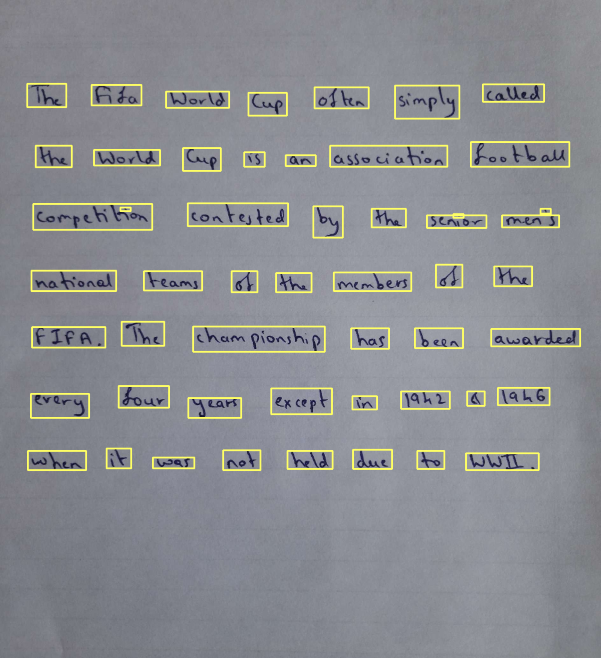

## Importing

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

## Reading and resizing

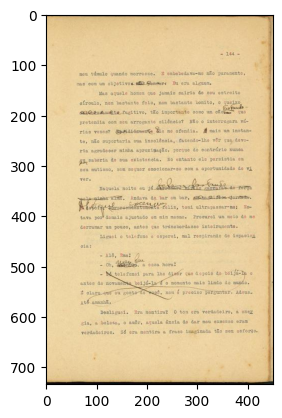

In [2]:
img = cv2.imread('Clarice-imagem-1-post-Fabio-datiloscrito-IMS.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

h, w, c = img.shape

if w > 1000:
    
    new_w = 1000
    ar = w/h
    new_h = int(new_w/ar)
    
    img = cv2.resize(img, (new_w, new_h), interpolation = cv2.INTER_AREA)
plt.imshow(img);

## Preprocessing

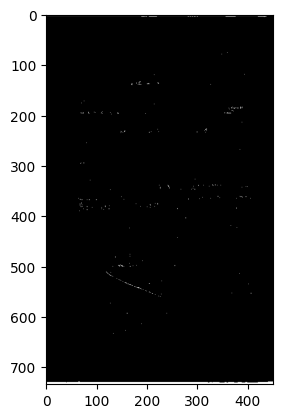

In [3]:
def thresholding(image):
    img_gray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    ret,thresh = cv2.threshold(img_gray,80,255,cv2.THRESH_BINARY_INV)
    plt.imshow(thresh, cmap='gray')
    return thresh

thresh_img = thresholding(img);

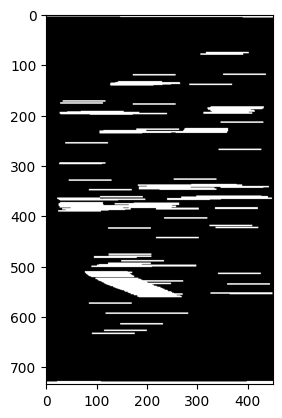

In [4]:
#dilation
kernel = np.ones((3,85), np.uint8)
dilated = cv2.dilate(thresh_img, kernel, iterations = 1)
plt.imshow(dilated, cmap='gray');

In [5]:
(contours, heirarchy) = cv2.findContours(dilated.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
sorted_contours_lines = sorted(contours, key = lambda ctr : cv2.boundingRect(ctr)[1]) # (x, y, w, h)

## Line segmentation

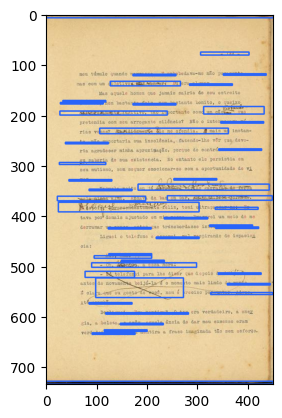

In [6]:
img2 = img.copy()

for ctr in sorted_contours_lines:
    
    x,y,w,h = cv2.boundingRect(ctr)
    cv2.rectangle(img2, (x,y), (x+w, y+h), (40, 100, 250), 2)
    
plt.imshow(img2);

C:\Users\lais23031\AppData\Local\Temp\ipykernel_31880\232825459.py:18: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  data = inter.rotate(arr, angle, reshape=False, order=0)


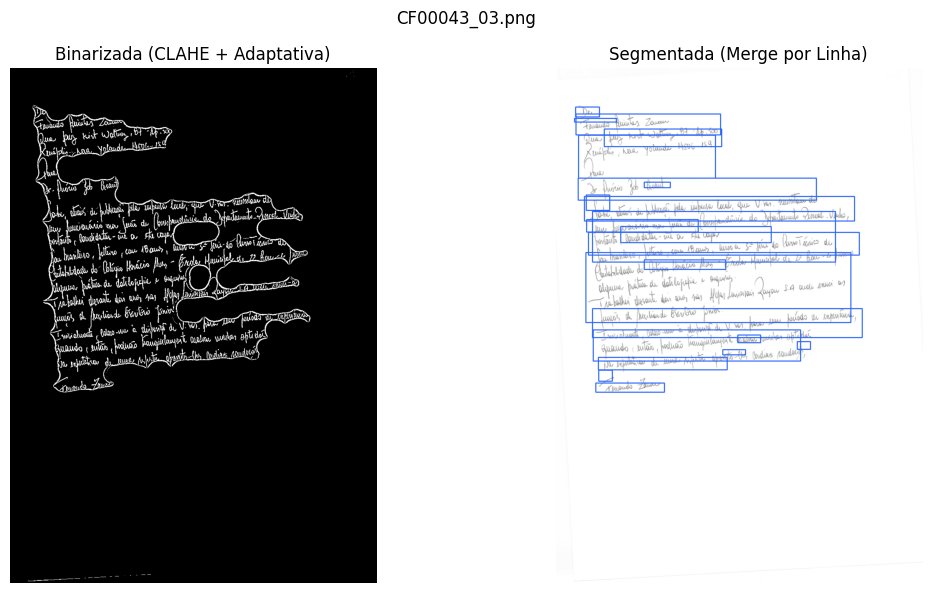

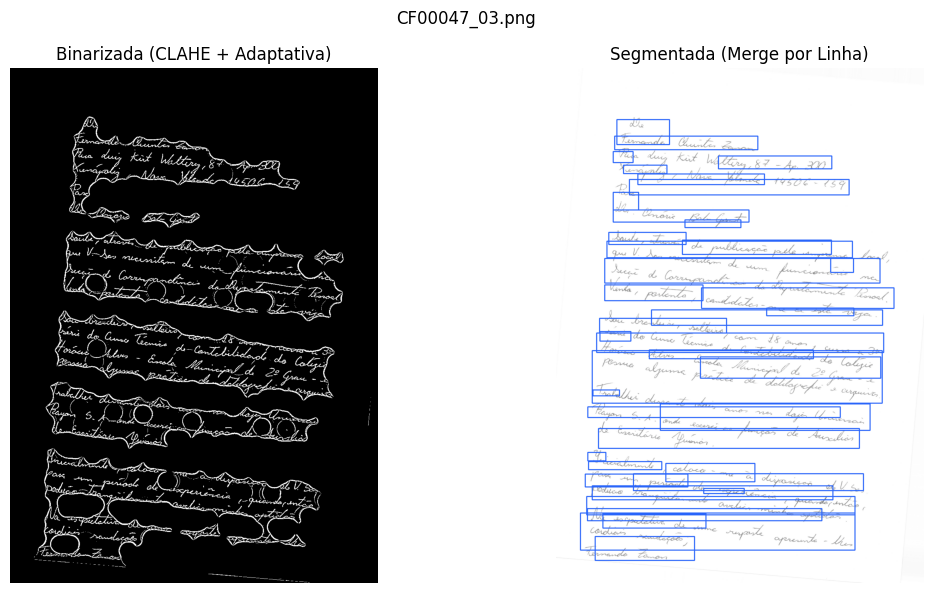

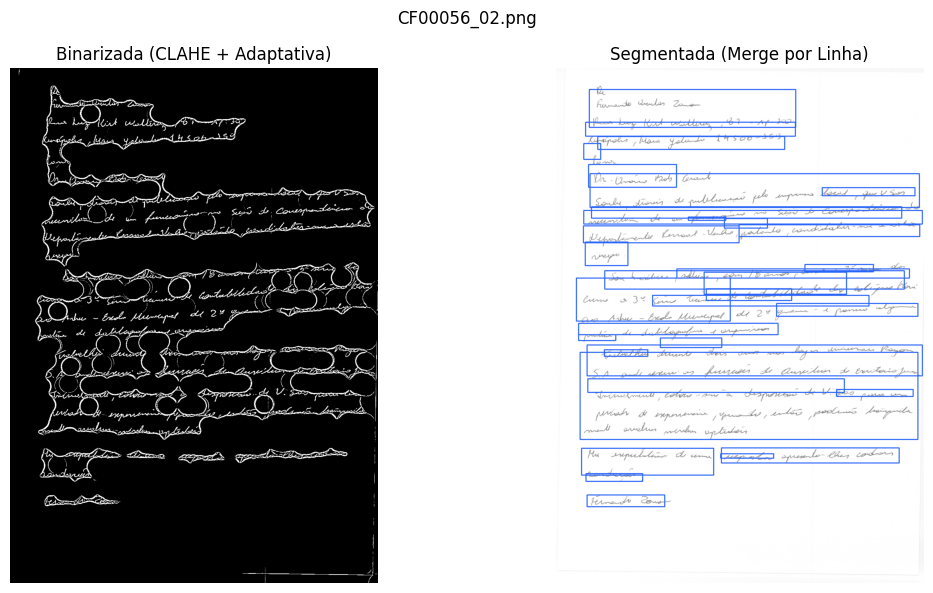

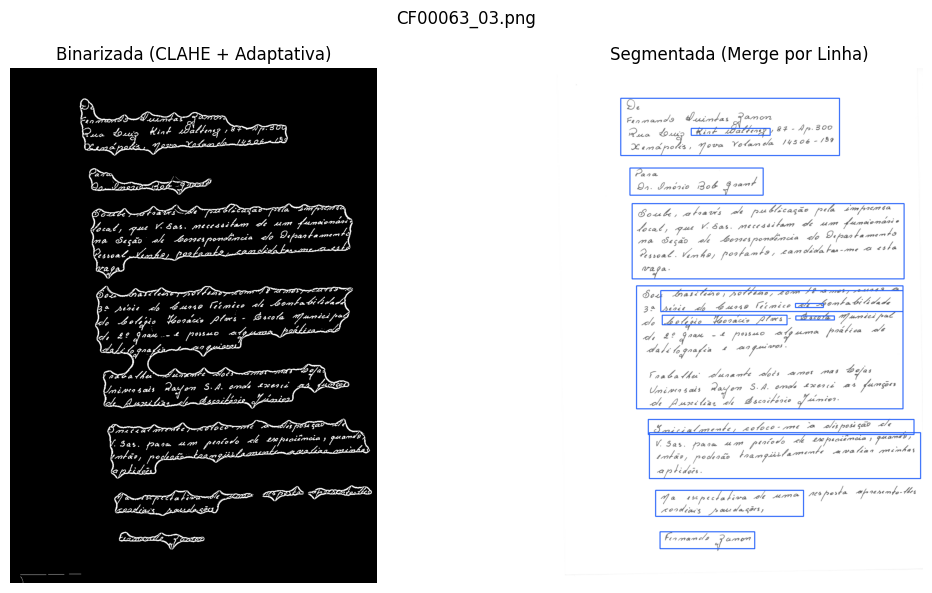

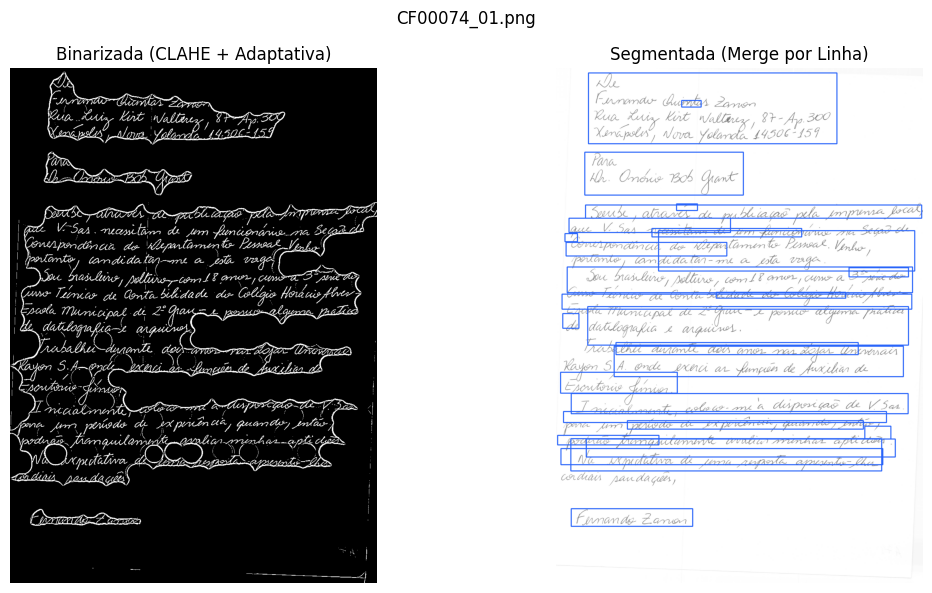

...

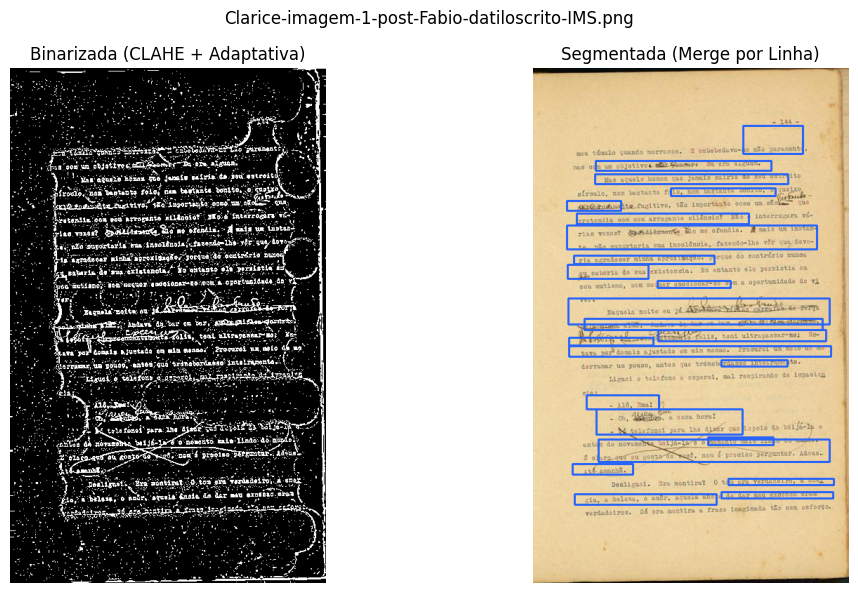

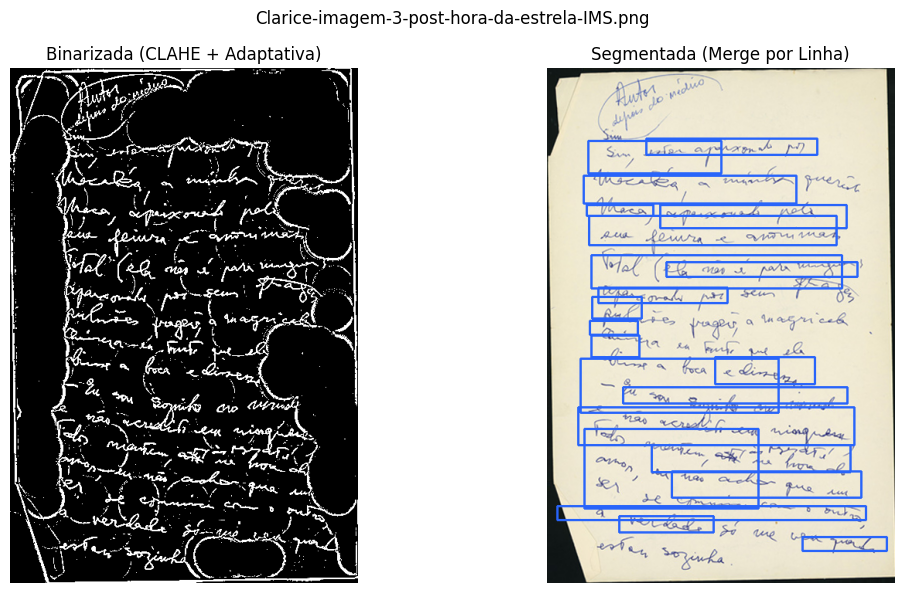

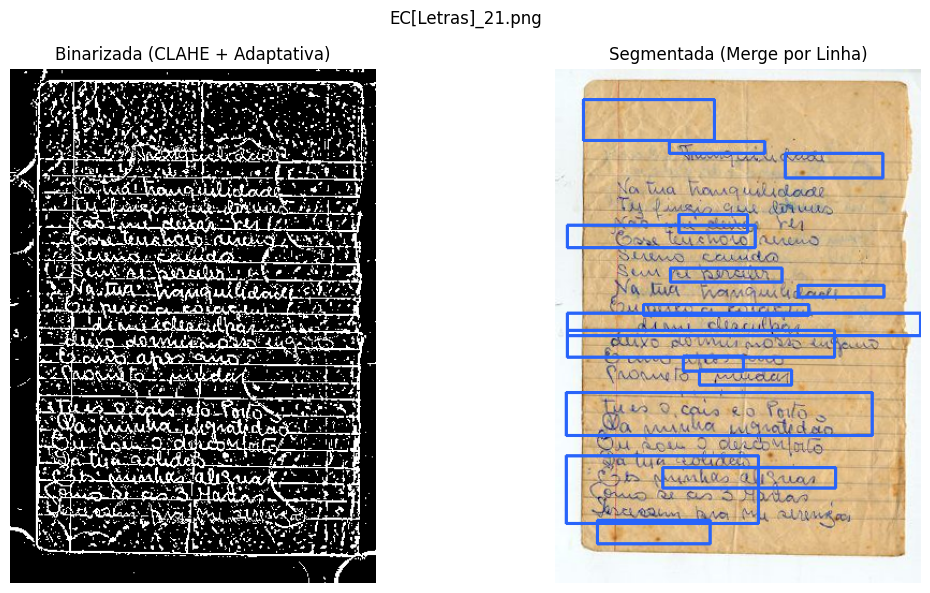

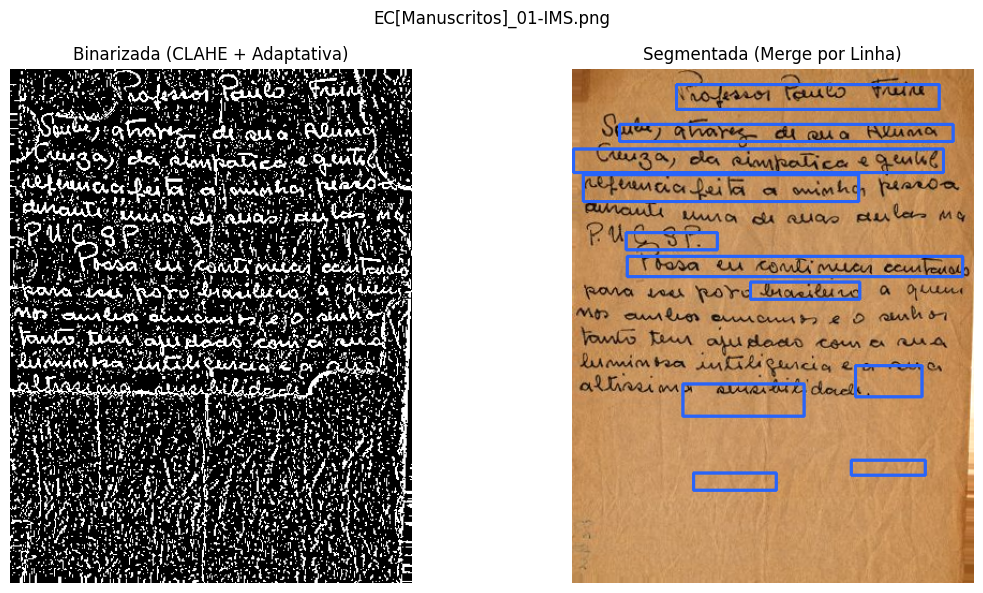

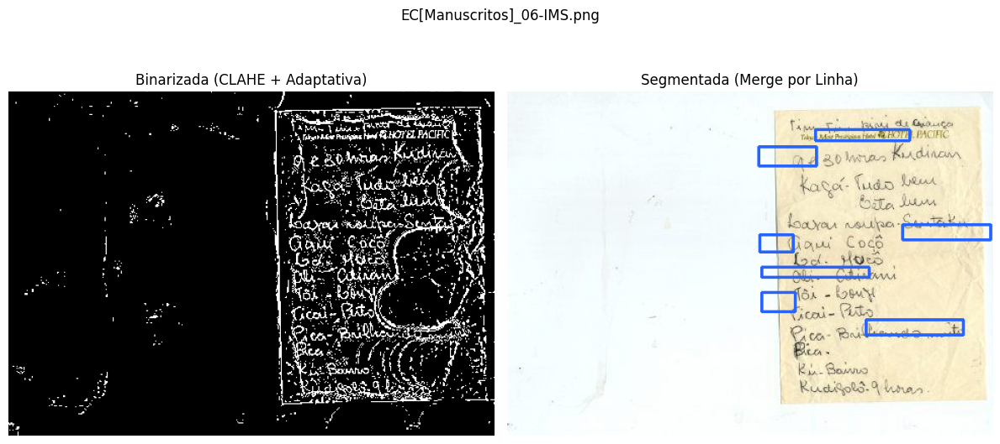

In [7]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
from scipy.ndimage import interpolation as inter

# ------------------------------------------------
# 1) Correção de inclinação (deskew) via projeção
# ------------------------------------------------
def correct_skew(image, delta=1, limit=5):
    """
    Detecta o ângulo de inclinação do texto e rotaciona a imagem para 'desentortar'.
    Usa projeção horizontal em diferentes ângulos para encontrar aquele que
    maximiza a variação (score) nas linhas, indicando que o texto ficou horizontal.
    """
    def determine_score(arr, angle):
        # Rotaciona a imagem binária sem mudar o shape
        data = inter.rotate(arr, angle, reshape=False, order=0)
        # Soma de pixels em cada linha (projeção horizontal)
        histogram = np.sum(data, axis=1)
        # Score: quanto maior a variação entre linhas adjacentes, melhor o alinhamento
        score = np.sum((histogram[1:] - histogram[:-1]) ** 2)
        return score

    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    # Binarização rápida para achar o ângulo
    _, bw = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    # Testa ângulos de -limit a +limit, pulando de delta em delta
    angles = np.arange(-limit, limit + delta, delta)
    scores = [determine_score(bw, a) for a in angles]
    best_angle = angles[np.argmax(scores)]

    (h, w) = image.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, best_angle, 1.0)
    rotated = cv2.warpAffine(
        image,
        M,
        (w, h),
        flags=cv2.INTER_CUBIC,
        borderMode=cv2.BORDER_REPLICATE
    )
    return rotated

# ------------------------------------------------
# 2) Pré‐processamento para binarização
# ------------------------------------------------
def preprocess_for_threshold(image):
    """
    Converte para cinza, remove fundo por abertura morfológica e equaliza via CLAHE.
    Devolve uma imagem em tons de cinza pronta para thresholding.
    """
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    # Estimar o fundo (paper, manchas) via abertura com kernel grande
    kernel_bg = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (51, 51))
    background = cv2.morphologyEx(gray, cv2.MORPH_OPEN, kernel_bg)

    # Subtrai o fundo para atenuar variações de iluminação/manchas
    diff = cv2.subtract(gray, background)

    # Equalização local de contraste (muito útil em manuscritos)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    eq = clahe.apply(diff)

    return eq

# ------------------------------------------------
# 3) Binarização adaptativa
# ------------------------------------------------
def thresholding_adap(image):
    """
    Recebe a imagem RGB “deskewed” e redimensionada. Executa preprocess_for_threshold,
    depois adaptiveThreshold com método GAUSSIAN_C, invertido (texto = branco).
    """
    eq = preprocess_for_threshold(image)
    thresh = cv2.adaptiveThreshold(
        eq,
        255,
        cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
        cv2.THRESH_BINARY_INV,
        15,
        10
    )
    return thresh

# ------------------------------------------------
# 4) Merge de retângulos que pertençam à mesma linha
# ------------------------------------------------
def merge_boxes_on_same_line(boxes):
    """
    Dado um array de retângulos [(x, y, w, h), ...], agrupa retângulos que
    estão na mesma linha (baseado em y_center) e retorna uma nova lista de
    retângulos mesclados.
    """
    merged = []
    # Copia lista para manipular
    to_process = boxes.copy()

    while to_process:
        # Pega o primeiro retângulo
        x0, y0, w0, h0 = to_process.pop(0)
        y_center = y0 + h0 / 2

        # Inicia grupo de retângulos na mesma linha
        group = [(x0, y0, w0, h0)]

        # Percorre o restante para ver quem cruza essa linha horizontal
        # (ou seja, cujo y <= y_center <= y+h)
        i = 0
        while i < len(to_process):
            x1, y1, w1, h1 = to_process[i]
            if y1 <= y_center <= (y1 + h1):
                # Adiciona ao grupo e remove de to_process
                group.append((x1, y1, w1, h1))
                to_process.pop(i)
            else:
                i += 1

        # Agora, unimos todos os retângulos de 'group' em um único
        xs = [r[0] for r in group]
        ys = [r[1] for r in group]
        xe = [r[0] + r[2] for r in group]
        ye = [r[1] + r[3] for r in group]

        x_min = min(xs)
        y_min = min(ys)
        x_max = max(xe)
        y_max = max(ye)

        merged.append((x_min, y_min, x_max - x_min, y_max - y_min))

    return merged

# ------------------------------------------------
# 5) Função principal para processar uma imagem
# ------------------------------------------------
def process_image(image_path):
    """
    1) Lê a imagem (open + imdecode) para não falhar em caminhos com acentos/colchetes.
    2) Corrige inclinação (deskew).
    3) Redimensiona se necessário.
    4) Faz binarização adaptativa.
    5) Limpeza morfológica, detecção de contornos e filtragem inicial.
    6) Agrupa (merge) retângulos que pertencem à mesma linha.
    7) Desenha e exibe.
    """
    # 1) Leitura robusta
    try:
        with open(image_path, 'rb') as f:
            arr = np.asarray(bytearray(f.read()), dtype=np.uint8)
            img = cv2.imdecode(arr, cv2.IMREAD_COLOR)
    except Exception as e:
        print(f"Erro ao abrir {image_path}: {e}")
        return
    if img is None:
        print(f"Erro ao ler {image_path}")
        return

    # Converter BGR → RGB para exibição no matplotlib
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # 2) Corrigir inclinação
    img_deskew = correct_skew(img_rgb)

    # 3) Redimensionar se muito larga (opcional, para desempenho)
    h, w, _ = img_deskew.shape
    if w > 1000:
        new_w = 1000
        new_h = int(new_w * h / w)
        img_deskew = cv2.resize(img_deskew, (new_w, new_h), interpolation=cv2.INTER_AREA)

    # 4) Binarização adaptativa
    thresh = thresholding_adap(img_deskew)

    # 5) Limpeza de ruídos (abertura leve) e dilatação
    opened = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, np.ones((3,3), np.uint8))
    dilated = cv2.dilate(opened, np.ones((3,30), np.uint8), iterations=1)

    # 6) Encontrar contornos externos
    contours, _ = cv2.findContours(dilated, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # 7) Filtrar contornos iniciais
    img_h, img_w = thresh.shape
    filtered = []
    for ctr in contours:
        x, y, w_ct, h_ct = cv2.boundingRect(ctr)
        area = cv2.contourArea(ctr)
        aspect = w_ct / float(h_ct) if h_ct > 0 else 0
        # Filtragem básica: descartar ruído e forma não textual
        if area < 500: 
            continue
        if aspect < 0.2 or aspect > 20:
            continue
        if x <= 0 or y <= 0 or x + w_ct >= img_w or y + h_ct >= img_h:
            continue
        filtered.append((x, y, w_ct, h_ct))

    # 8) Merge de retângulos na mesma linha
    merged_boxes = merge_boxes_on_same_line(filtered)

    # 9) Desenhar caixas finais
    img_segmented = img_deskew.copy()
    for (x, y, w_box, h_box) in merged_boxes:
        cv2.rectangle(img_segmented, (x, y), (x + w_box, y + h_box), (40, 100, 250), 2)

    # 10) Exibir lado a lado
    plt.figure(figsize=(12, 6))
    plt.suptitle(os.path.basename(image_path), fontsize=12)

    plt.subplot(1, 2, 1)
    plt.imshow(thresh, cmap='gray')
    plt.title('Binarizada (CLAHE + Adaptativa)')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(img_segmented)
    plt.title('Segmentada (Merge por Linha)')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# ------------------------------------------------
# 11) Loop em lote para todos os PNGs
# ------------------------------------------------
base_dir = "imagens_em_png"
for root, dirs, files in os.walk(base_dir):
    if ".ipynb_checkpoints" in root:
        continue
    for file in files:
        if file.lower().endswith(".png"):
            process_image(os.path.join(root, file))
